# Cloud Inpainting on SEN3 Data
This notebook is a quick test to load, mask with clouds and then try and recover the data hidden by clouds using an inpainting DL model

In [ ]:
!pip install tensorflow
!pip install keras==3.3.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 41.4 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')




Mounted at /content/drive


In [ ]:
!mkdir cloud_inpainting
!cp -R "/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/network" "/content/cloud_inpainting"
!cp -R "/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/data" "/content/cloud_inpainting"

In [ ]:
import sys
sys.path.insert(0,"/content/cloud_inpainting")

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from network.model import SAGAN
from network.callbacks import LearningRateSchedulerCallback, OutputImageToTensorBoard, ShiftGPCenterAfterX
import keras
import os


%load_ext autoreload
# Load the TensorBoard notebook extension
%load_ext tensorboard
%autoreload 2


In [ ]:
gpus = tf.config.list_logical_devices('GPU')
strategy = tf.distribute.MirroredStrategy(gpus)


## Extracting the bands from the Xarrays

The goal here is to convert the data into a more tensorflow friendly data format

In [ ]:
dsnp = np.moveaxis(np.load("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/Ground_truth3.npy"),3,0)

In [ ]:
!rm -rf ./cloud_inpainting/data/cloudless/*

In [ ]:
for i in range(2000):
  ds = dsnp[i,:,:,:]
  for j in range(11):
    ds[:,:,j] = (ds[:,:,j] - np.mean(ds[:,:,j]))/(2*np.std(ds[:,:,j]))
  np.save("./cloud_inpainting/data/cloudless/cloudless_"+str(i)+".npy", ds)

In [ ]:
#Split into training and test set
BATCH_SIZE = 20
SHUFFLE_BUFFER_SIZE = 100
#path to cloudless npy arrays (1000 arrays of 256x256x11 that are the ground truth and will be masked with cloud files)
PATH_TO_CLOUD_MASKS = "./cloud_inpainting/data/masks"
PATH_TO_CLOUD_CLOUDLESS = "./cloud_inpainting/data/cloudless"

npy_files_masks = [f for f in os.listdir(PATH_TO_CLOUD_MASKS) if f.endswith('.npy')]
npy_files_cloudless = [f for f in os.listdir(PATH_TO_CLOUD_CLOUDLESS) if f.endswith('.npy')]




class keras_augmenter(keras.Model):
    def __init__(self):
      super(keras_augmenter, self).__init__()
      self.augmenter = keras.Sequential([
                        keras.layers.RandomFlip(seed=42),
                        keras.layers.RandomRotation(0.2, seed=42),
                        ])
    def call(self, x):
      return self.augmenter(x)

augmenter = keras_augmenter()

def mask_generator(files, PATH):
    for file in files:
        yield np.expand_dims(np.load(os.path.join(PATH, file)),axis=-1)

#Dataset is already normalized now to save time
def normalize_ds(ds):
    return (ds/0.5 - 1)

def npy_generator(files, PATH):
    for file in files:
        yield np.load(os.path.join(PATH, file))



train_cloudless_ds = tf.data.Dataset.from_generator(npy_generator, args=[npy_files_cloudless[:1800], PATH_TO_CLOUD_CLOUDLESS], output_shapes=(256,256,11), output_types=tf.float32).shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
train_mask_ds = tf.data.Dataset.from_generator(mask_generator, args=[npy_files_masks[:800], PATH_TO_CLOUD_MASKS],output_shapes=(256,256,1), output_types=tf.float32).repeat().shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
train_pre_ds = tf.data.Dataset.zip((train_mask_ds.map(lambda x: augmenter(x)), train_cloudless_ds))

test_cloudless_ds = tf.data.Dataset.from_generator(npy_generator, args=[npy_files_cloudless[1800:], PATH_TO_CLOUD_CLOUDLESS], output_shapes=(256,256,11), output_types=tf.float32).shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
test_mask_ds = tf.data.Dataset.from_generator(mask_generator, args=[npy_files_masks[800:], PATH_TO_CLOUD_MASKS],output_shapes=(256,256,1), output_types=tf.float32).repeat().batch(BATCH_SIZE, drop_remainder=True)
test_pre_ds = tf.data.Dataset.zip((test_mask_ds.map(lambda z: augmenter(z)), test_cloudless_ds))

del train_cloudless_ds, train_mask_ds, test_cloudless_ds, test_mask_ds

In [ ]:

#del dsnp
#del dsnp_c
#train_ds = train_ds.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
#test_ds = test_ds.batch(BATCH_SIZE)

train_ds = train_pre_ds.prefetch(tf.data.AUTOTUNE).cache().repeat()
test_ds = test_pre_ds

## Model Definition

In [ ]:
model = SAGAN(32)
gen_opti = keras.optimizers.Adam(learning_rate=0.00008)
disc_opti = keras.optimizers.Adam(learning_rate=0.00004)
model.compile(strategy=strategy, gen_optimizer=gen_opti, dis_optimizer=disc_opti)
model.optimizer.learning_rate = 0.0004
print(model.summary())


/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:361: UserWarning: `build()` was called on layer 'gated_conv2d_76', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:361: UserWarning: `build()` was called on layer 'gated_conv2d_92', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Model: "sagan_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gen_model_2 (GenModel)               │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ multi_discriminator_2                │ ?                           │     0 (unbuilt) │
│ (MultiDiscriminator)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg_from_torch_2 (VGG_fromTorch)     │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_153 (Functional)          │ ?                           │         557,888 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,775,461 (83.07 MB)

 Trainable params: 7,037,209 (26.84 MB)

 Non-trainable params: 14,738,252 (56.22 MB)

None


In [ ]:
!rm -rf ./cloud_inpainting/logs/train
!rm -rf ./cloud_inpainting/logs/validation
!rm -rf ./cloud_inpainting/logs/images

In [ ]:
!cp "./cloud_inpainting/SAGAN.keras" "/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/SAGAN.keras"

cp: cannot stat './cloud_inpainting/SAGAN.keras': No such file or directory


In [ ]:
%tensorboard --logdir ./cloud_inpainting/logs

<IPython.core.display.Javascript object>

Still a problem of divergence, Wasserstein loss is not good at fitting the data. Using the original loss for the discriminator and generator might be better : issue is that the generator loss when paired with the other losses is very small so does not have much influence in training I fear. An adaptative weight might be useful to counter this issue

In [ ]:
!rm -rf ./cloud_inpainting/logs/plugins

In [ ]:
model.fit(train_ds, epochs=15000, steps_per_epoch=90, initial_epoch=0,  validation_data=test_ds, callbacks=[ShiftGPCenterAfterX(sagan=model, target = 0, trigger1=None, trigger2=25), OutputImageToTensorBoard(sagan=model.generator, epochs=20, test_ds=test_ds, log_dir="./cloud_inpainting/logs/images"),keras.callbacks.ModelCheckpoint(filepath='./cloud_inpainting/SAGAN.keras', save_best_only=True, save_freq="epoch"), tf.keras.callbacks.TensorBoard(log_dir='./cloud_inpainting/logs'),  keras.callbacks.CSVLogger('./cloud_inpainting/SAGAN.csv'), keras.callbacks.TerminateOnNaN()])
#LearningRateSchedulerCallback(model, 100, 0.8, 0.001),

Epoch 1/15000
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 880ms/step - loss: 3.3089

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_api.py:100: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  saving_lib.save_model(model, filepath)


90/90 ━━━━━━━━━━━━━━━━━━━━ 313s 1s/step - loss: 3.3073 - val_dis_loss: 1.9725 - val_gen_loss: -2.9018e-04 - val_loss: 2.9774 - val_perceptual_loss: 1.2057 - val_reconstruct_loss: 2.9757 - val_ssim: 0.9211 - val_style_loss: 0.8011
Epoch 2/15000
90/90 ━━━━━━━━━━━━━━━━━━━━ 83s 927ms/step - loss: 2.8912 - val_dis_loss: 1.8029 - val_gen_loss: -3.9428e-06 - val_loss: 2.7795 - val_perceptual_loss: 1.2073 - val_reconstruct_loss: 2.7774 - val_ssim: 0.9317 - val_style_loss: 0.8697
Epoch 3/15000
90/90 ━━━━━━━━━━━━━━━━━━━━ 83s 928ms/step - loss: 2.7367 - val_dis_loss: 1.6178 - val_gen_loss: 4.5928e-04 - val_loss: 2.6399 - val_perceptual_loss: 1.2072 - val_reconstruct_loss: 2.6373 - val_ssim: 0.9266 - val_style_loss: 0.9188
Epoch 4/15000
90/90 ━━━━━━━━━━━━━━━━━━━━ 83s 927ms/step - loss: 2.6468 - val_dis_loss: 1.6233 - val_gen_loss: -0.0010 - val_loss: 2.5890 - val_perceptual_loss: 1.2132 - val_reconstruct_loss: 2.5878 - val_ssim: 0.9341 - val_style_loss: 0.9233
Epoch 5/15000
90/90 ━━━━━━━━━━━━━━━━━

In [ ]:
!cp -R "./cloud_inpainting" "/content/drive/MyDrive/Colab Notebooks/"

In [ ]:
model.evaluate(test_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 63s 370ms/step - dis_loss: 2.0066 - gen_loss: 3.9735e-05 - loss: 1.2504 - perceptual_loss: 1.2210 - reconstruct_loss: 1.2485 - ssim: 0.8680 - style_loss: 0.6306


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


[1.2390098571777344,
 1.2371163368225098,
 0.6295191049575806,
 1.2269560098648071,
 3.713195474119857e-05,
 2.0026819705963135,
 <KerasVariable shape=(), dtype=float32, path=ssim/ssim>]

In [ ]:
model.gp_center = 0
model.gam_reg = 20

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


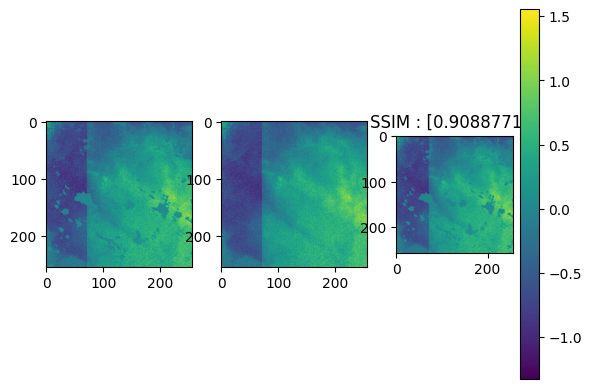

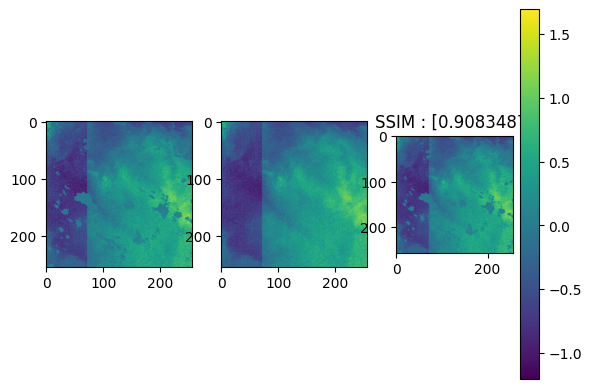

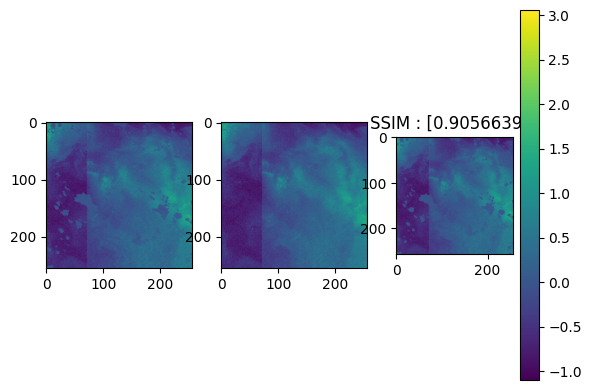

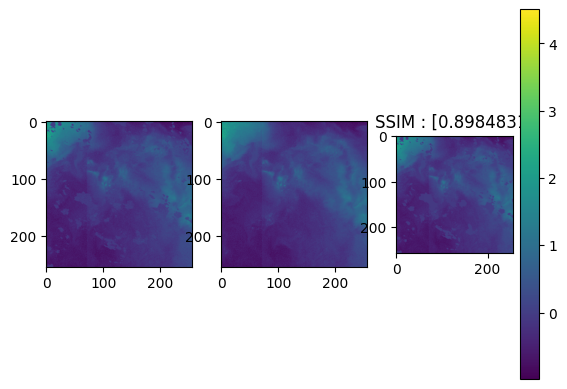

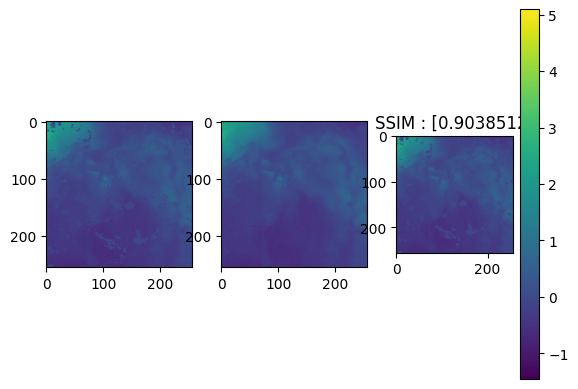

...

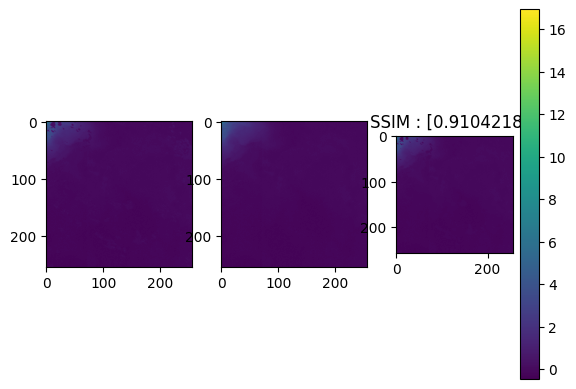

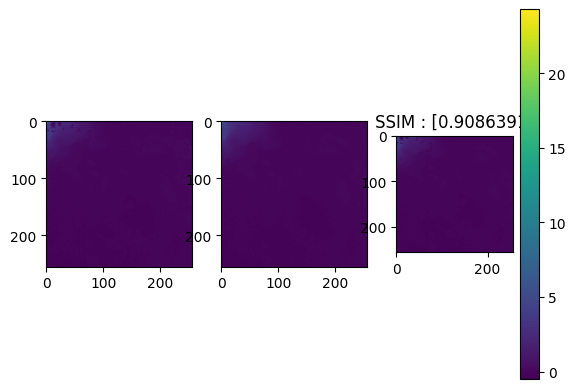

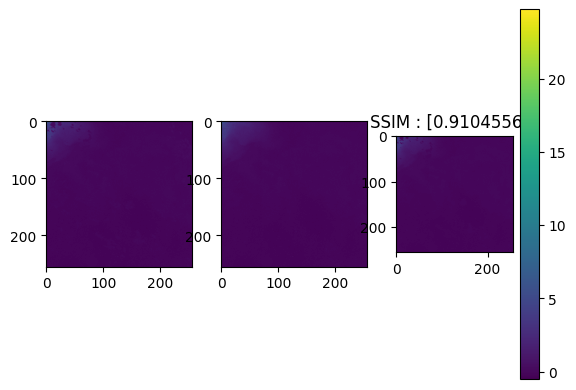

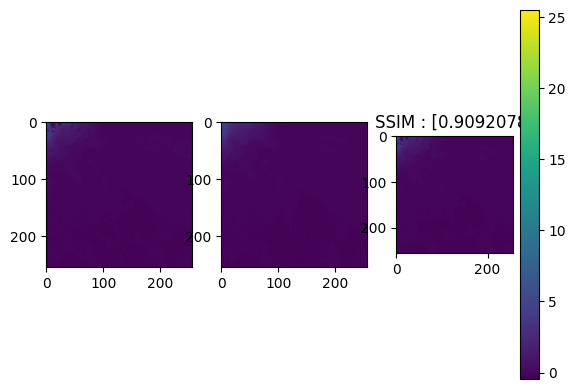

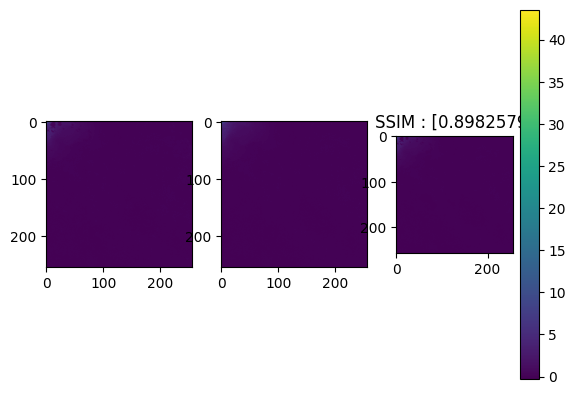

In [ ]:

y = test_ds.take(3)
masks,y = y.as_numpy_iterator().next()

batch = tf.shape(y)[0]
h = tf.shape(y)[1]
w = tf.shape(y)[2]

x = tf.zeros(shape=(batch,h,w,0))
for i in range(11):
  x = tf.concat([x,tf.expand_dims(y[:,:,:,i] * (1 - masks[:,:,:,0]) + masks[:,:,:,0]*tf.reduce_mean(y[:,:,:,i],axis=0), axis=-1)], axis=-1)

x = np.concatenate((x,masks),axis = -1)
coarse, refined = model.generator.predict(x)

complete = tf.expand_dims(x[:,:,:,-1],axis=-1)*refined + (1-tf.expand_dims(x[:,:,:,-1],axis=-1))*y

for i in range(11):
  ssim_val = tf.image.ssim(complete[15:16,:,:,i:i+1], y[15:16,:,:,i:i+1], max_val=1)
  plt.figure()
  plt.subplot(1,3,1)
  plt.imshow(x[1,:,:,i])
  plt.subplot(1,3,2)
  plt.imshow(y[1,:,:,i])
  plt.subplot(1,3,3)
  plt.imshow(complete[1,:,:,i])
  plt.title(f"SSIM : {ssim_val}")
  plt.colorbar()
  #plt.savefig("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/performance/test4_band_"+str(i)+".png")
  plt.show()



In [ ]:
model.save_weights("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/SAGAN_noisy_fitter_most_epoch.weights.h5")

In [ ]:
#Normalizer
npy_files_cloudless = [f for f in os.listdir(PATH_TO_CLOUD_CLOUDLESS) if f.endswith('.npy')]

for i in range(len(npy_files_cloudless)):
  file = np.load(os.path.join(PATH_TO_CLOUD_CLOUDLESS, npy_files_cloudless[i]))
  norm = (np.log(file) - np.min(np.log(file)))/(np.max(np.log(file)) - np.min(np.log(file)))
  np.save(os.path.join(PATH_TO_CLOUD_CLOUDLESS, npy_files_cloudless[i]), norm)

In [ ]:
np.max(dsnp_c[10:11,:,:,:])
np.max(refined[:,:,:,0])
np.max(coarse[:,:,:,0])
refined2 = (refined[0,:,:,0] - np.min(refined[0,:,:,0]))/(np.max(refined[0,:,:,0]) - np.min(refined[0,:,:,0]))
coarse2 = (coarse[0,:,:,0] - np.min(coarse[0,:,:,0]))/(np.max(coarse[0,:,:,0]) - np.min(coarse[0,:,:,0]))

refined2 = tf.expand_dims(tf.expand_dims(refined2, axis=0),axis=-1)
coarse2 = tf.expand_dims(tf.expand_dims(coarse2, axis=0),axis=-1)

np.max(coarse2[:,:,:,0])
np.max(refined2[:,:,:,0])

In [ ]:
test_dataset = test_ds.take(2)
x,y = test_dataset.as_numpy_iterator().next()
coarse, refined = model.generator.predict(x)
x = x.astype(np.float32)
y = y.astype(np.float32)
coarse = coarse.astype(np.float32)
refined = refined.astype(np.float32)

refined2 = np.zeros_like(refined)
coarse2 = np.zeros_like(coarse)

out = np.zeros_like(refined)

for i in range(11):
  #refined2[:,:,:,i] = (refined[:,:,:,i] - tf.reduce_min(refined[:,:,:,i], axis=0, keepdims=True))/( tf.reduce_max(refined[:,:,:,i], axis=0, keepdims=True) - tf.reduce_min(refined[:,:,:,i], axis=0, keepdims=True))
  #coarse2[:,:,:,i] = (coarse[:,:,:,i] - tf.reduce_min(coarse[:,:,:,i], axis=0, keepdims=True))/( tf.reduce_max(coarse[:,:,:,i], axis=0, keepdims=True) - tf.reduce_min(coarse[:,:,:,i], axis=0, keepdims=True))
  out[:,:,:,i] = x[:,:,:,-1]*refined[:,:,:,i]+ (1-x[:,:,:,-1])*x[:,:,:,i]


for j in range(x.shape[0]):
  for k in range(11):
    x1 = x[j,:,:,k]
    out1 = out[j,:,:,k]
    y1 = y[j,:,:,k]
    ssim_val = tf.image.ssim(tf.expand_dims(out1, axis=-1), tf.expand_dims(y1, axis=-1), max_val=1)
    fig = plt.figure()
    ax = fig.add_subplot(131)
    ax.set_title("Cloudy image")
    ax.imshow(x1)
    ax = fig.add_subplot(132)
    ax.set_title("Inpainted image")
    ax.imshow(out1)
    ax =fig.add_subplot(133)
    ax.set_title("Ground truth")
    ax.imshow(y1)
    fig.suptitle(f"SSIM: {ssim_val}")
    fig.savefig("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/performance/validation_batch_"+str(j)+"_chan_"+str(k)+".png")

In [ ]:
validation_loss = model.evaluate(test_ds)

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 295ms/step - dis_loss: 2.0000 - gen_loss: -0.0036 - loss: 0.1831 - perceptual_loss: 0.8364 - reconstruct_loss: 0.1852 - ssim: 0.9760 - style_loss: 0.6018


In [ ]:
#Load keras file


model.load_weights("./cloud_inpainting/SAGAN.keras")



In [ ]:
model.generator.optimizer.learning_rate = 0.00009
model.discriminator.optimizer.learning_rate = 0.00009
model.gam_reg = 50

In [ ]:
print(model.generator.Inputs)

In [ ]:
extractor = keras.Model(inputs=model.generator.input, outputs=model.generator.layers[1].output)
features = extractor.predict(dsnp_c[1:2,:,:,1:3])


fig = plt.figure()
for i, feature in enumerate(features):
    ax = fig.add_subplot(5,4,i+1)
    ax.imshow(feature[0,:,:,0])
fig.savefig('features-2.png')